### Necessary Packages

In [1]:
import sys
import os
import torch
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import warnings
sys.path.append('../..')
from src.models import VQVAE
from src.utils import load_json,seed_everything,make_grid
from src.training.vqvae import Config,create_loaders
from IPython import display
from torchinfo import summary
import definitions as D

In [2]:
sns.set_theme(style="whitegrid",palette="husl")

In [3]:
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

### Load configurations

In [4]:
EXPIREMENT = 'vqvae_cartoon'

In [5]:
config_path = os.path.join(D.EXPERIMENTS_DIR, EXPIREMENT, 'config.json')
config = Config(**load_json(config_path))

### Reproducibility

In [6]:
seed_everything(config.seed)

### Load model

In [7]:
checkpoint_path = os.path.join(D.EXPERIMENTS_DIR, EXPIREMENT, 'checkpoints', 'checkpoint.pth')
state_dict = torch.load(checkpoint_path, map_location=config.device)
model = VQVAE(config.vqvae_args).to(config.device).eval()
model.load_state_dict(state_dict['vqvae'])

<All keys matched successfully>

In [8]:
config.image_size

[128, 128]

In [9]:
summary(model, (16, 3, *config.image_size),device=config.device)

Layer (type:depth-idx)                             Output Shape              Param #
VQVAE                                              --                        12,288
├─Sequential: 1-1                                  [16, 3, 16, 16]           --
│    └─Conv2d: 2-1                                 [16, 32, 128, 128]        896
│    └─DownSampleBlock: 2-2                        [16, 64, 64, 64]          --
│    │    └─Sequential: 3-1                        --                        136,000
│    │    └─Conv2d: 3-2                            [16, 64, 64, 64]          65,600
│    └─DownSampleBlock: 2-3                        [16, 64, 32, 32]          --
│    │    └─Sequential: 3-3                        --                        156,544
│    │    └─Conv2d: 3-4                            [16, 64, 32, 32]          65,600
│    └─DownSampleBlock: 2-4                        [16, 128, 16, 16]         --
│    │    └─Sequential: 3-5                        --                        542,336
│    │ 

### History

In [10]:
history_path = os.path.join(D.EXPERIMENTS_DIR, EXPIREMENT, 'history.csv')
history = pd.read_csv(history_path)

In [11]:
train_loader,_,test_dataloader = create_loaders(config)

In [12]:
history.head()

,epoch,split,d_real_loss,d_fake_loss,d_loss,vqvae_loss,rec_loss,commitment_loss,codebook_loss,adversarial_loss,lpips_loss
0,0,train,0.000000,0.000000,0.000000,0.093966,0.045595,0.001962,0.001962,0.000000,0.046017
1,0,val,0.000000,0.000000,0.000000,0.040650,0.016119,0.001796,0.001796,0.000000,0.022376
2,1,train,0.690027,0.690285,0.690156,0.180187,0.012368,0.001735,0.001735,0.294503,0.018485
3,1,val,0.645464,0.740213,0.692839,0.359141,0.011294,0.001761,0.001761,0.650404,0.020532
4,2,train,0.689719,0.689835,0.689777,0.380654,0.010655,0.001663,0.001663,0.702960,0.016523


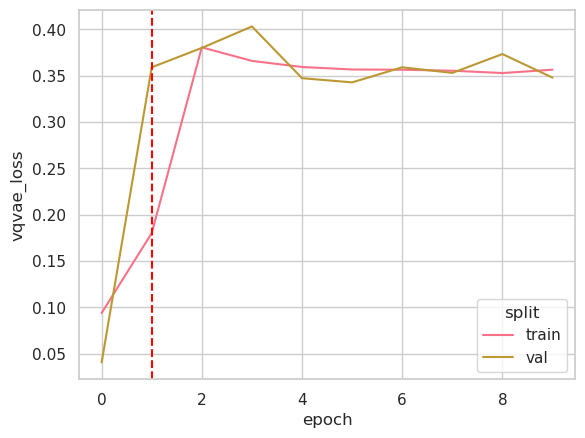

In [13]:
ax = sns.lineplot(data=history, x='epoch', y='vqvae_loss',hue='split')
plt.axvline(x=config.disc_start_iter // len(train_loader), color='r', linestyle='--')

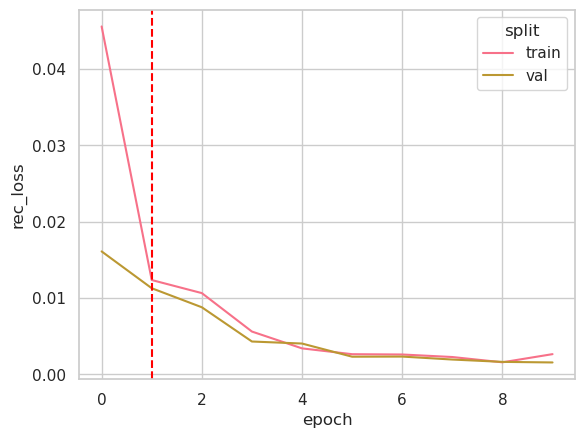

In [14]:
ax = sns.lineplot(data=history, x='epoch', y='rec_loss',hue='split')
plt.axvline(x=config.disc_start_iter // len(train_loader), color='r', linestyle='--')

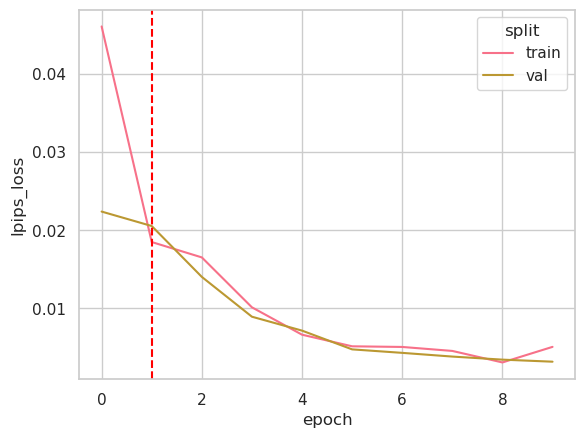

In [15]:
ax = sns.lineplot(data=history, x='epoch', y='lpips_loss',hue='split')
plt.axvline(x=config.disc_start_iter // len(train_loader), color='r', linestyle='--')

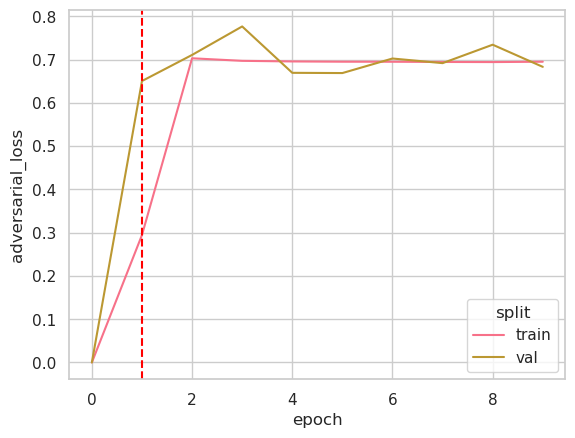

In [16]:
ax = sns.lineplot(data=history, x='epoch', y='adversarial_loss',hue='split')
plt.axvline(x=config.disc_start_iter // len(train_loader), color='r', linestyle='--')

In [17]:
gif_path = os.path.join(D.EXPERIMENTS_DIR, EXPIREMENT, 'images.gif')

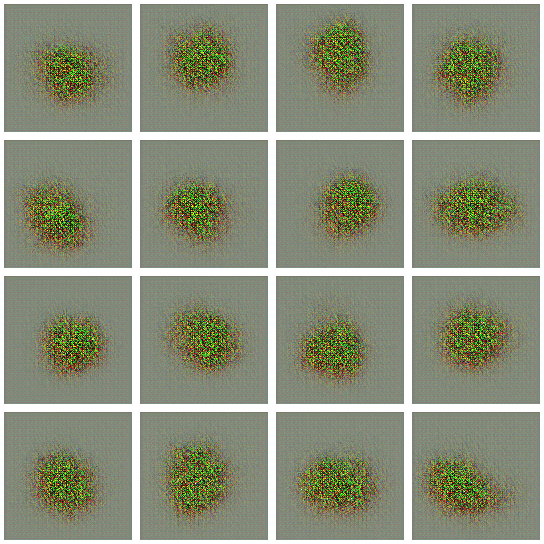

In [18]:
display.Image(filename=gif_path)

### Test the autoencoder

In [19]:
batch = next(iter(train_loader))

In [20]:
with torch.inference_mode():
    output = model(batch['data'].to(config.device))

In [21]:
decoded_images = output['dec_out'].detach().cpu()
decoded_images = (decoded_images + 1) / 2
original_images = (batch['data'] + 1) / 2

In [22]:
quant_images = output['quant_out'].detach().cpu()
quant_images = (quant_images - quant_images.min()) / (quant_images.max() - quant_images.min())

Text(0.5, 1.0, 'Quantized')

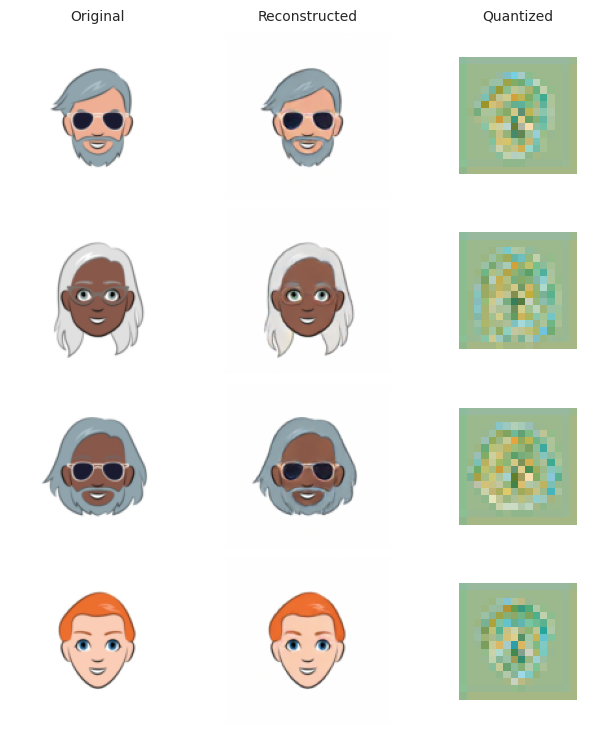

In [23]:
N = 4

dpi = plt.rcParams['figure.dpi'] / 3
fig_h = config.image_size[0] * N / dpi
fig_w = config.image_size[1] * 2 / dpi

fig, ax = plt.subplots(1, 3, figsize=(fig_w, fig_h))

ax[0].imshow(make_grid(original_images[:N], h=N, w=1, gap=4, gap_value=1.0))
ax[1].imshow(make_grid(decoded_images[:N], h=N, w=1, gap=4, gap_value=1.0))
ax[2].imshow(make_grid(quant_images[:N], h=N, w=1, gap=4, gap_value=1.0))

ax[0].axis('off')
ax[1].axis('off')
ax[2].axis('off')

ax[0].set_title('Original', fontsize=10)
ax[1].set_title('Reconstructed', fontsize=10)
ax[2].set_title('Quantized', fontsize=10)

In [24]:
fig_path = os.path.join(D.EXPERIMENTS_DIR, EXPIREMENT, 'images.png')
fig.savefig(fig_path)